## Import Libraries

In [1]:
#Import Libraries
import numpy as np
from random import sample
import pandas as pd
import matplotlib.pyplot as plt
from collections import deque
import math

## Import the Reward and Transition Matrix from the xls file

In [2]:
#Import the reward table and the transition matrix
r_table = pd.read_excel('environment_matrices.xlsx', sheet_name ='rewards', index_col=0)
state_value_function = pd.read_excel('environment_matrices.xlsx', sheet_name ='State value function')
transition_matrix = pd.read_excel('environment_matrices.xlsx', sheet_name ='transition',index_col=0)

## Initialize important parameters and Q matrix

In [3]:
#Initialize parameters
total_episodes = 10000 #Total episodes
number_of_steps = 100 #Maximum steps per episode
epsilon = 0.4 # Epsilon with constant value

#Q Learning parameters
alpha = 0.15 #Learning rate
gamma = 0.999 #Discount rate

#Initialization of the Q matrix
q_table = pd.DataFrame(np.matrix(np.zeros([16,4])).astype("float32"), columns = transition_matrix.columns, index = transition_matrix.index)
q_table.head()

,UP,DOWN,RIGHT,LEFT
A,0.0,0.0,0.0,0.0
B,0.0,0.0,0.0,0.0
C,0.0,0.0,0.0,0.0
D,0.0,0.0,0.0,0.0
E,0.0,0.0,0.0,0.0


In [4]:
#%% Define the optimal state value table
optimal_state_value_function = np.array(state_value_function)
optimal_state_value_function

array([[-6, -5, -4, -5],
       [-5,  0, -3,  0],
       [-4, -3, -2,  0],
       [ 0, -2, -1,  0]], dtype=int64)

## Epsilon constant greedy policy

In [5]:
# ε-constant policy function

def e_constant_policy(state, epsilon):
    exploration_threshold = np.random.uniform(0,1)
    actions_list = ["UP", "DOWN", "RIGHT", "LEFT"]
    #With probability 1-ε choose the action with the highest q-value
    #e-constant policy implementation
    if (exploration_threshold >= epsilon):
        # Exploit: Then we choose the best action from the Q table
        action = q_table.loc[state, :].argmax()
    else:
        # Explore: We take a random action from the action list
        action = sample(actions_list, 1)[0]
    return action


## 'execute_action' Function

In [6]:
# Execution of the action selected from policy.
def execute_action(state, action):
    next_state = transition_matrix.loc[state,action] #return the next state
    reward = r_table.loc[state, next_state]
    end_episode_states = ['F', 'H', 'L', 'M', 'P']
    done = False #done is a flag to determine if my algorithm is going to terminate or not
    if (next_state in end_episode_states):
        done = True
    print('Current state', state)
    print('Next state', next_state)
    print ('Done', done)
    
    
    return next_state, reward, done

## 'update_Q' Function


In [7]:
#Update Q

def update_Q(current_state, next_state, action, reward, alpha, gamma):
    q_old = q_table.loc[current_state, action] #OLD Q value
    q_new = q_old + alpha * (reward + gamma * max(q_table.loc[next_state,:] - q_old))
    #q_new_values.append(q_new) # # add the new q value to a list with all the q new values
    q_table.loc[current_state, action] = q_new
    
    print('Old Q value:       ', q_old)
    print('Updated Q value (Q new): ', q_new)

## Train the agent

In [8]:
#Training the agent
sum_reward = 0
episodes_rewards_list_per_10 = []

#Main
episodes_rewards_list = []
window = 100
# initialize average rewards
average_reward = deque(maxlen=total_episodes)
# initialize best average reward as negative infinity
best_average_reward = -math.inf
# initialize monitor for most recent rewards
check_rewards = deque(maxlen=window)

#EPISODES
for episode in range(1, total_episodes + 1):
    current_state = 'A'
    episode_reward = 0
    # Decide the value of epsilon before the start of the episode
    for step in range (number_of_steps):
        #Choose action depending on the value of epsilon
        action = e_constant_policy(current_state, epsilon)
        
        #Execute Action and calculate the next state, the reward and check if the episode is finished
        next_state, reward, done = execute_action(current_state, action)
        
        # Update the Q Matrix based on the new values
        update_Q(current_state, next_state, action, reward, alpha, gamma)
        current_state = next_state #replace the current state with the value of the next state
        
        episode_reward += reward #calculate summary of rewards per episode
        
        if done:
            check_rewards.append(episode_reward)
            break
    
    #Calculate best average reward for early stopping purposes
    if episode >= 100:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   
        average_reward = np.mean(check_rewards)
        if average_reward > best_average_reward:
            best_average_reward = average_reward
    print("\rEpisode {}/{} || Best average reward {}".format(episode, total_episodes, best_average_reward), end="")

    if best_average_reward > 50:
        print('\nThe environment is solved in {} episodes.'.format(episode-1), end = "")
        break
    
    episodes_rewards_list.append(episode_reward)
    print("\rThe reward for this episode is: {}".format(episode_reward))
    
    episode_reward = 0

C:\Users\kimon\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning: 
The current behaviour of 'Series.argmax' is deprecated, use 'idxmax'
instead.
The behavior of 'argmax' will be corrected to return the positional
maximum in the future. For now, use 'series.values.argmax' or
'np.argmax(np.array(values))' to get the position of the maximum
row.
  # Remove the CWD from sys.path while we load stuff.


Current state A
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state B
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state B
Next state F
Done True
Old Q value:        0.0
Updated Q value (Q new):  -15.0
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state E
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state A
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.15
Current state A
Next state A
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.3000000059604645
Current state A
Next state E
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state E
Next state I
Done False
Old Q value:        0.0
U

Old Q value:        -0.86907035
Updated Q value (Q new):  -0.9562726616874337
Current state B
Next state B
Done False
Old Q value:        -0.45000002
Updated Q value (Q new):  -0.6000000178813935
Current state B
Next state C
Done False
Old Q value:        -0.5005808
Updated Q value (Q new):  -0.5980462575212121
Current state C
Next state D
Done False
Old Q value:        -0.15
Updated Q value (Q new):  -0.27752250506728887
Current state D
Next state C
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.17870927415266633
Current state C
Next state B
Done False
Old Q value:        -0.19158675
Updated Q value (Q new):  -0.40036595531702046
Current state B
Next state A
Done False
Old Q value:        -0.58384037
Updated Q value (Q new):  -0.7749412477880716
Current state A
Next state A
Done False
Old Q value:        -0.8581205
Updated Q value (Q new):  -1.0081205010414123
Current state A
Next state A
Done False
Old Q value:        -0.89039993
Updated Q value (Q new):  -1.04039993

Next state E
Done False
Old Q value:        -1.2782602
Updated Q value (Q new):  -1.3363123579919338
Current state E
Next state I
Done False
Old Q value:        -0.6646608
Updated Q value (Q new):  -0.7600163906186819
Current state I
Next state I
Done False
Old Q value:        -0.3
Updated Q value (Q new):  -0.450000011920929
Current state I
Next state E
Done False
Old Q value:        -0.344955
Updated Q value (Q new):  -0.5556509909555316
Current state E
Next state E
Done False
Old Q value:        -0.75
Updated Q value (Q new):  -0.9
Current state E
Next state I
Done False
Old Q value:        -0.7600164
Updated Q value (Q new):  -0.8539603996112943
Current state I
Next state J
Done False
Old Q value:        -0.38593575
Updated Q value (Q new):  -0.47810328090935944
Current state J
Next state I
Done False
Old Q value:        0.0
Updated Q value (Q new):  -0.21743250267952682
Current state I
Next state I
Done False
Old Q value:        -0.45000002
Updated Q value (Q new):  -0.60000001788

Done False
Old Q value:        -0.83447796
Updated Q value (Q new):  -0.7727093484520912
Current state J
Next state N
Done False
Old Q value:        0.57872605
Updated Q value (Q new):  2.9140150327682495
Current state N
Next state O
Done False
Old Q value:        17.163904
Updated Q value (Q new):  23.778656713867186
Current state O
Next state P
Done True
Old Q value:        62.3074
Updated Q value (Q new):  67.97063589725494
The reward for this episode is: 94.0ard -inf
Current state A
Next state A
Done False
Old Q value:        -2.0780766
Updated Q value (Q new):  -2.1930330527842044
Current state A
Next state E
Done False
Old Q value:        -1.8442191
Updated Q value (Q new):  -1.9200378180146218
Current state E
Next state I
Done False
Old Q value:        -1.3491822
Updated Q value (Q new):  -1.4127977872788906
Current state I
Next state I
Done False
Old Q value:        -0.865227
Updated Q value (Q new):  -1.001363219511509
Current state I
Next state J
Done False
Old Q value:      

Old Q value:        -1.1077884
Updated Q value (Q new):  -0.3882699193239212
Current state E
Next state I
Done False
Old Q value:        4.694804
Updated Q value (Q new):  5.14321083741188
Current state I
Next state M
Done True
Old Q value:        -47.810326
Updated Q value (Q new):  -55.645948328018186
The reward for this episode is: -104.0d -inf
Current state A
Next state E
Done False
Old Q value:        0.78751487
Updated Q value (Q new):  1.2902159411668777
Current state E
Next state I
Done False
Old Q value:        5.143211
Updated Q value (Q new):  5.524423790287972
Current state I
Next state I
Done False
Old Q value:        -1.0013633
Updated Q value (Q new):  0.30061413507461543
Current state I
Next state J
Done False
Old Q value:        8.688175
Updated Q value (Q new):  10.492782396507263
Current state J
Next state I
Done False
Old Q value:        -0.04077102
Updated Q value (Q new):  1.3876820597469806
Current state I
Next state E
Done False
Old Q value:        -0.38826993
U

Updated Q value (Q new):  54.50539795684814
Current state N
Next state M
Done True
Old Q value:        -38.593575
Updated Q value (Q new):  -47.810327381515506
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        15.477485
Updated Q value (Q new):  16.339893531560897
Current state E
Next state E
Done False
Old Q value:        2.8062625
Updated Q value (Q new):  5.567453898334502
Current state E
Next state I
Done False
Old Q value:        22.233633
Updated Q value (Q new):  23.8679603808403
Current state I
Next state J
Done False
Old Q value:        34.141056
Updated Q value (Q new):  37.042652669906616
Current state J
Next state N
Done False
Old Q value:        54.505398
Updated Q value (Q new):  57.83592505397797
Current state N
Next state J
Done False
Old Q value:        0.5774814
Updated Q value (Q new):  9.007659483146666
Current state J
Next state N
Done False
Old Q value:        57.835926
Updated Q value (Q new):  60.6673736536026
Cur

Next state A
Done False
Old Q value:        2.0614917
Updated Q value (Q new):  5.534390890312195
Current state A
Next state E
Done False
Old Q value:        26.238329
Updated Q value (Q new):  27.826617000865937
Current state E
Next state I
Done False
Old Q value:        37.838516
Updated Q value (Q new):  40.48197109050751
Current state I
Next state J
Done False
Old Q value:        56.48019
Updated Q value (Q new):  58.58903623332977
Current state J
Next state N
Done False
Old Q value:        71.55424
Updated Q value (Q new):  74.08112551651001
Current state N
Next state O
Done False
Old Q value:        89.41802
Updated Q value (Q new):  90.64845148658752
Current state O
Next state N
Done False
Old Q value:        28.529387
Updated Q value (Q new):  37.687928310394284
Current state N
Next state M
Done True
Old Q value:        -47.810326
Updated Q value (Q new):  -55.645948328018186
The reward for this episode is: -110.0d -inf
Current state A
Next state E
Done False
Old Q value:      

Updated Q value (Q new):  97.05765586967468
Current state O
Next state P
Done True
Old Q value:        99.62827
Updated Q value (Q new):  99.69897629966736
The reward for this episode is: 94.0ard -inf
Current state A
Next state E
Done False
Old Q value:        56.360134
Updated Q value (Q new):  58.13496498889923
Current state E
Next state A
Done False
Old Q value:        12.452508
Updated Q value (Q new):  19.14802414970398
Current state A
Next state E
Done False
Old Q value:        58.134964
Updated Q value (Q new):  59.64383659820557
Current state E
Next state A
Done False
Old Q value:        19.148024
Updated Q value (Q new):  25.06632095298767
Current state A
Next state A
Done False
Old Q value:        15.184878
Updated Q value (Q new):  21.697053156471252
Current state A
Next state E
Done False
Old Q value:        59.643837
Updated Q value (Q new):  60.926604967117306
Current state E
Next state I
Done False
Old Q value:        69.205185
Updated Q value (Q new):  70.78542927856445

Current state J
Next state F
Done True
Old Q value:        -67.970634
Updated Q value (Q new):  -72.78523488655091
The reward for this episode is: -103.0rd -20.53
Current state A
Next state A
Done False
Old Q value:        35.942413
Updated Q value (Q new):  42.68762608337402
Current state A
Next state E
Done False
Old Q value:        81.95651
Updated Q value (Q new):  82.72947467346191
Current state E
Next state I
Done False
Old Q value:        88.11575
Updated Q value (Q new):  88.62443145217895
Current state I
Next state J
Done False
Old Q value:        92.51134
Updated Q value (Q new):  92.93079174613953
Current state J
Next state N
Done False
Old Q value:        96.3115
Updated Q value (Q new):  96.50509391365051
Current state N
Next state J
Done False
Old Q value:        37.36071
Updated Q value (Q new):  46.07349642982483
Current state J
Next state N
Done False
Old Q value:        96.5051
Updated Q value (Q new):  96.66967945632935
Current state N
Next state O
Done False
Old Q v

Old Q value:        57.901165
Updated Q value (Q new):  63.46101512432098
Current state I
Next state E
Done False
Old Q value:        37.8525
Updated Q value (Q new):  46.09884660758972
Current state E
Next state I
Done False
Old Q value:        93.88417
Updated Q value (Q new):  94.05196727027894
Current state I
Next state J
Done False
Old Q value:        96.00494
Updated Q value (Q new):  96.1134763999939
Current state J
Next state N
Done False
Old Q value:        97.73026
Updated Q value (Q new):  97.77187050209045
Current state N
Next state O
Done False
Old Q value:        99.00893
Updated Q value (Q new):  99.02010157241821
Current state O
Next state P
Done True
Old Q value:        100.0845
Updated Q value (Q new):  100.08684037322998
The reward for this episode is: 90.0ward -6.02
Current state A
Next state E
Done False
Old Q value:        91.11063
Updated Q value (Q new):  91.40138565788268
Current state E
Next state I
Done False
Old Q value:        94.05196
Updated Q value (Q ne

Old Q value:        66.76059
Updated Q value (Q new):  70.72666974716186
Current state A
Next state B
Done False
Old Q value:        37.089447
Updated Q value (Q new):  41.16880184249878
Current state B
Next state A
Done False
Old Q value:        65.31337
Updated Q value (Q new):  69.49631579284667
Current state A
Next state E
Done False
Old Q value:        94.22859
Updated Q value (Q new):  94.27719415855408
Current state E
Next state I
Done False
Old Q value:        95.55393
Updated Q value (Q new):  95.60202796325683
Current state I
Next state I
Done False
Old Q value:        63.461014
Updated Q value (Q new):  68.31823338890075
Current state I
Next state J
Done False
Old Q value:        96.87589
Updated Q value (Q new):  96.89162944641113
Current state J
Next state N
Done False
Old Q value:        97.98191
Updated Q value (Q new):  97.99492425613403
Current state N
Next state O
Done False
Old Q value:        99.069756
Updated Q value (Q new):  99.07369158248902
Current state O
Next

Old Q value:        68.31823
Updated Q value (Q new):  72.46665941047668
Current state I
Next state J
Done False
Old Q value:        97.00311
Updated Q value (Q new):  97.0105472114563
Current state J
Next state N
Done False
Old Q value:        98.05373
Updated Q value (Q new):  98.05851510009765
Current state N
Next state O
Done False
Old Q value:        99.086685
Updated Q value (Q new):  99.0883403957367
Current state O
Next state P
Done True
Old Q value:        100.09873
Updated Q value (Q new):  100.09893700523376
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        84.97037
Updated Q value (Q new):  86.29135362167358
Current state A
Next state E
Done False
Old Q value:        94.78676
Updated Q value (Q new):  94.80436675453186
Current state E
Next state I
Done False
Old Q value:        95.905266
Updated Q value (Q new):  95.9208917186737
Current state I
Next state J
Done False
Old Q value:        97.010544
Updated Q value (Q new):  97.

Old Q value:        97.05701
Updated Q value (Q new):  97.0603998134613
Current state J
Next state K
Done False
Old Q value:        55.606884
Updated Q value (Q new):  60.075877748298645
Current state K
Next state O
Done False
Old Q value:        86.431
Updated Q value (Q new):  88.32922375831603
Current state O
Next state K
Done False
Old Q value:        39.014122
Updated Q value (Q new):  46.25398998756408
Current state K
Next state O
Done False
Old Q value:        88.32922
Updated Q value (Q new):  89.94299878730774
Current state O
Next state P
Done True
Old Q value:        100.099495
Updated Q value (Q new):  100.09958561820984
The reward for this episode is: 93.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        94.94629
Updated Q value (Q new):  94.95574020004273
Current state E
Next state I
Done False
Old Q value:        96.01036
Updated Q value (Q new):  96.0177093914032
Current state I
Next state J
Done False
Old Q value:        97.0604
Updated Q value (Q ne

Next state E
Done False
Old Q value:        95.061615
Updated Q value (Q new):  95.06359603576661
Current state E
Next state I
Done False
Old Q value:        96.075836
Updated Q value (Q new):  96.07710840301513
Current state I
Next state J
Done False
Old Q value:        97.08533
Updated Q value (Q new):  97.08599686927795
Current state J
Next state F
Done True
Old Q value:        -96.79
Updated Q value (Q new):  -97.28601927833557
The reward for this episode is: -104.0rd 0.08
Current state A
Next state B
Done False
Old Q value:        60.321854
Updated Q value (Q new):  63.563501776885985
Current state B
Next state A
Done False
Old Q value:        82.955475
Updated Q value (Q new):  84.61987720184327
Current state A
Next state A
Done False
Old Q value:        82.54159
Updated Q value (Q new):  84.26801114845276
Current state A
Next state E
Done False
Old Q value:        95.0636
Updated Q value (Q new):  95.06547335472106
Current state E
Next state F
Done True
Old Q value:        -99.4

Done True
Old Q value:        100.10007
Updated Q value (Q new):  100.10007207794189
The reward for this episode is: 91.0ward 0.08
Current state A
Next state A
Done False
Old Q value:        88.048874
Updated Q value (Q new):  88.95308177604676
Current state A
Next state E
Done False
Old Q value:        95.08396
Updated Q value (Q new):  95.08442999305726
Current state E
Next state I
Done False
Old Q value:        96.08809
Updated Q value (Q new):  96.08858836364746
Current state I
Next state J
Done False
Old Q value:        97.09242
Updated Q value (Q new):  97.09280524673461
Current state J
Next state N
Done False
Old Q value:        98.09598
Updated Q value (Q new):  98.09622906913758
Current state N
Next state O
Done False
Old Q value:        99.098656
Updated Q value (Q new):  99.09871834793091
Current state O
Next state K
Done False
Old Q value:        53.17977
Updated Q value (Q new):  59.1940561378479
Current state K
Next state O
Done False
Old Q value:        94.31614
Updated 

Old Q value:        92.53945
Updated Q value (Q new):  92.77167245025635
Current state A
Next state A
Done False
Old Q value:        92.771675
Updated Q value (Q new):  92.96909726791382
Current state A
Next state E
Done False
Old Q value:        95.09014
Updated Q value (Q new):  95.09038686599732
Current state E
Next state I
Done False
Old Q value:        96.09278
Updated Q value (Q new):  96.0929969116211
Current state I
Next state J
Done False
Old Q value:        97.09522
Updated Q value (Q new):  97.0954223121643
Current state J
Next state N
Done False
Old Q value:        98.09756
Updated Q value (Q new):  98.09761971511841
Current state N
Next state O
Done False
Old Q value:        99.098976
Updated Q value (Q new):  99.09899076538086
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.090385
Updated Q value (Q

Current state J
Next state N
Done False
Old Q value:        98.097984
Updated Q value (Q new):  98.09799437103271
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09373
Updated Q value (Q new):  95.09381834068299
Current state E
Next state I
Done False
Old Q value:        96.09534
Updated Q value (Q new):  96.0954121372223
Current state I
Next state I
Done False
Old Q value:        92.12481
Updated Q value (Q new):  92.71986805648804
Current state I
Next state J
Done False
Old Q value:        97.09684
Updated Q value (Q new):  97.0968625377655
Current state J
Next state N
Done False
Old Q value:        98.09799
Updated Q value (Q new):  98.09800085716248
Current state N
Next state O
Done False
Old Q val

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09478
Updated Q value (Q new):  95.09480374450683
Current state E
Next state I
Done False
Old Q value:        96.09594
Updated Q value (Q new):  96.09594969329834
Current state I
Next state I
Done False
Old Q value:        93.655876
Updated Q value (Q new):  94.02152972869872
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        89.64072
Updated Q value (Q new):  90.60804178886414
Current state I
Next state E
Done False
Old Q value:        88.04072
Updated Q value (Q new):  89.09779417228698
Current state E
Next state F
Done True
Old Q value:        -100.06497
Updated Q value (

Old Q value:        51.74092
Updated Q value (Q new):  58.53753381462097
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -96.79
Updated Q value (Q new):  -97.28601927833557
The reward for this episode is: -108.0rd 0.08
Current state A
Next state A
Done False
Old Q value:        93.73222
Updated Q value (Q new):  93.78643003425599
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        88.52692
Updated Q value (Q new)

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        87.73589
Updated Q value (Q new):  89.01806788711548
Current state K
Next state L
Done True
Old Q value:        -80.35814
Updated Q value (Q new):  -83.31647190322876
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
N

Updated Q value (Q new):  94.33451792030334
Current state I
Next state E
Done False
Old Q value:        91.41001
Updated Q value (Q new):  91.9622045135498
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -99.332214
Updated Q value (Q new):  -99.44728203430176
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        93.87169
Updated Q value (Q new):  93.90499648628234
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        93.70488
Updated Q value (Q new):  93.76318374519349
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current stat

Done False
Old Q value:        93.81275
Updated Q value (Q new):  93.85489113388061
Current state A
Next state B
Done False
Old Q value:        86.77417
Updated Q value (Q new):  87.51844877433777
Current state B
Next state A
Done False
Old Q value:        92.742
Updated Q value (Q new):  92.9445887664795
Current state A
Next state A
Done False
Old Q value:        93.95738
Updated Q value (Q new):  93.977848695755
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -99.62827
Updated Q value (Q new):  -99.69897629966736
The reward for this episode is: -108.0rd 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q valu

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Upda

Done False
Old Q value:        93.71088
Updated Q value (Q new):  93.76828184318542
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        91.198524
Updated Q value (Q new):  92.0910687625885
Current state K
Next state O
Done False
Old Q value:        98.15578
Updated Q value (Q new):  98.29713000144959
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Curr

Old Q value:        94.07989
Updated Q value (Q new):  94.08199648132324
Current state A
Next state A
Done False
Old Q value:        93.989426
Updated Q value (Q new):  94.00509044075012
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.020996
Updated Q value (Q new):  -100.03284982910156
The reward for this episode is: -105.0rd 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        92.73756
Updated Q value (Q new):  93.48746131591797
Current state K
Next state O
Done False
Old Q value:        98.74293
Updated Q value (Q new):  98.79629606170654
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.00705
Updated Q value (Q new):  -100.02099318389892
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        91.632996
Updated Q value (Q new):  91.80477319145203
Current state B
Next state A
Done False
Old Q value:  

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        95.4723
Updated Q value (Q new):  95.82039869346619
Current state K
Next state O
Done False
Old Q value:        98.796295
Updated Q value (Q new):  98.84166653938293
Current state O
Next state K
Done False
Old Q value:        93.487465
Updated Q value (Q new):  94.13979211502075
Current state K
Next state O
Done False
Old Q value:        98.84167
Updated Q value (Q new):  98.88023955307007
Current state O
Next state N
Done False
Old Q value:        96.521454
Updated Q value (Q new):  96.75770700340271
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.08176
Updated Q value (Q new):  -100.08450536651611
The reward for this episode is: -107.0rd 0.08
Current state A
Next state A
Done False
Old Q value:        94.07643
Updated Q value (Q new):  94.07905826454163
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.065544
Updated Q value (Q new):  96.07010895233154
Current state I
Next state E
Done False
Old Q value:        94.368225
Updated Q value (Q new):  94.47712998085022
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value 

Old Q value:        94.08319
Updated Q value (Q new):  94.08480497550964
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.074715
Updated Q value (Q new):  -100.07851866874695
The reward for this episode is: -104.0rd 0.08
Current state A
Next state A
Done False
Old Q value:        94.08481
Updated Q value (Q new):  94.08618003501893
Current state A
Next state B
Done False
Old Q value:        92.611984
Updated Q value (Q new):  92.6689734828949
Current state B
Next state A
Done False
Old Q value:        93.99329
Updated Q value (Q new):  94.00837890853882
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        97.592
Updated Q value (Q new):  97.6678342453003
Current state N
Next state M
Done True
Old Q value:        -99.44728
Updated Q value (Q new):  -99.54510584335327
The reward for this episode is: -108.0rd 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.08684
Updated Q value (Q new):  -100.08882512893676
The reward for this episode is: -103.0rd 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old

Updated Q value (Q new):  97.26531006965637
Current state K
Next state G
Done False
Old Q value:        21.032125
Updated Q value (Q new):  25.4484475815773
Current state G
Next state K
Done False
Old Q value:        51.504745
Updated Q value (Q new):  58.474375394821166
Current state K
Next state O
Done False
Old Q value:        99.01646
Updated Q value (Q new):  99.02883678588867
Current state O
Next state N
Done False
Old Q value:        97.873314
Updated Q value (Q new):  97.90699082183838
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.03907
Updated Q value (Q new):  95.04744888458252
C

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.09911
Updated Q value (Q new):  -100.0992613117218
The reward for this episode is: -101.0rd 0.08
Current state A
Next state A
Done False
Old Q value:        94.09147
Updated Q value (Q new):  94.09184242630005
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False

Next state A
Done False
Old Q value:        94.084656
Updated Q value (Q new):  94.08605031242371
Current state A
Next state A
Done False
Old Q value:        94.09266
Updated Q value (Q new):  94.09285426254273
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.09702
Updated Q value (Q new):  -100.09748411216736
The reward for this episode is: -109.0rd 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.08605
Updated Q value (Q new):  94.08723727416992
Current state A
Next state B
Done False
Old Q value:        92.96311
Updated Q value (Q new):  92.97959523658753
Current state B
Next state B
Done False
Old Q value:        65

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0ward 0.08
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.1
Updated Q value (Q new):  -100.10001370277405
The reward for this episode is: -101.0rd 0.08
Current state A
Next state A
Done False
Old Q value:        94.09373
Updated Q value (Q new):  94.09376232070923
Current state A
Next state A
Done False
Old Q value:        94.093025
Updated Q value (Q new):  94.09316559677124
Current state A
Next state A
Done False
Old Q value:        94.093765
Updated Q value (Q new):  94.09379475135803
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False


Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.08824
Updated Q value (Q new):  94.08909879341125
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.03129
Updated Q value (Q new):  97.04113942718506
Current state J
Next state K
Done False
Old Q value:        97.70241
Updated Q value (Q new):  97.75702479248046
Current state K
Next state O
Done False
Old Q value:        99.06789
Updated Q value (Q new):  9

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        99.033325
Updated Q value (Q new):  99.04317761878967
Current state O
Next state K
Done False
Old Q value:        96.9665
Updated Q value (Q new):  97.13319510269164
Current state K
Next state J
Done False
Old Q value:        82.538925
Updated Q value (Q new):  84.72045704307556
Current state J
Next state F
Done True
Old Q value:        -100.09702
Updated Q value (Q new):  -100.09748411216736
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.08821
Updated Q value (Q new):  95.08922604637146
Current state E
Next state E
Done False
Old Q value:        95.089226
Updated Q value (Q new):  95.09008870162964
Current state E
Next state A
Done False
Old Q value:        94.09045
Updated Q value (Q new):  94.09097328491211
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        95.94173
Updated Q value (Q new):  95.96484555244446
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next s

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        97.804756
Updated Q value (Q new):  97.84583915176391
Current state K
Next state G
Done False
Old Q value:        25.448448
Updated Q value (Q new):  30.247383566474916
Current state G
Next state C
Done False
Old Q value:        8.468047
Updated Q value (Q new):  16.961653565597533
Current state C
Next state B
Done False
Old Q value:        66.14977
Updated Q value (Q new):  70.1870198802948
Current state B
Next state A
Done False
Old Q value:        94.0927
Updated Q value (Q new):  94.09288669319153
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.097010948944

Old Q value:        -100.09873
Updated Q value (Q new):  -100.09893700523376
The reward for this episode is: -103.0rd 1.95
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0rd 1.95
Current state A
Next state A
Done False
Old Q value:        94.09374
Updated Q value (Q new):  94.09377529296874
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.09911
Updated Q value (Q new):  -100.0992613117218
The reward for this episode is: -103.0rd 1.95
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.04235
Updated Q value (Q new):  98.05069751281738
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0ward 3.87
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.0924
Updated Q value (Q new):  94.09263373413086
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Curre

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.06022
Updated Q value (Q new):  96.06558163375854
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0ward 7.73
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.074554
Updated Q value (Q

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.05779
Updated Q value (Q new):  98.06382543945313
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        97.72618
Updated Q value (Q new):  97.78124385910034
Current state K
Next state J
Done False
Old Q value:        86.57509
Updated Q value (Q new):  88.15180129814148
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.07331
Updated Q value (Q new):  98.07701822738647
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095474
Updated Q value (Q new):  96.09555403938293
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Old Q value:        99.096344
Updated Q value (Q new):  99.0967530506134
Current state O
Next state O
Done False
Old Q value:        99.095535
Updated Q value (Q new):  99.09606552085876
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.089066
Updated Q value (Q new):  97.09025888786316
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  

Old Q value:        98.08383
Updated Q value (Q new):  98.08596260032654
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0ward 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.093376
Updated Q value (Q new):  94.09346395874023
Current state A
Next state A
Done False
Old Q value:        94.09392
Updated Q value (Q new):  94.09392447395325
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0ward 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09606
Updated Q value (Q new):  99.09651306381225
Current state O
Next state N
Done False
Old Q v

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09213
Updated Q value (Q new):  97.09286631202698
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.07702
Updated Q value (Q new):  98.0801704864502
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Current state I
Next state E
Done False
Old Q value:        95.08727
Updated Q value (Q new):  95.08842825241089
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.091736
Updated Q value (Q new):  98.09268223075867
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:    

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0ward 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09467
Updated Q value (Q new):  95.0947197982788
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.1

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.09091
Updated Q value (Q new):  96.09167533378601
Current state I
Next state E
Done False
Old Q value:        95.09025
Updated Q value (Q new):  95.09095784301758
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0rd 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09479
Updated Q value (Q new):  95.09481709022522
Current state E
Next state I
Done False
Old Q

Updated Q value (Q new):  96.09590429039001
Current state I
Next state E
Done False
Old Q value:        95.09207
Updated Q value (Q new):  95.0925080280304
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.08684
Updated Q value (Q new):  -100.08882512893676
The reward for this episode is: -107.0rd 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09251
Updated Q value (Q new):  95.09287773742676
Cur

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09319
Updated Q value (Q new):  95.09346148910522
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Old Q value:        95.094925
Updated Q value (Q new):  95.09493384056091
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.088715
Updated Q value (Q new):  98.0901137233734
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.098564
Updated Q value (Q new):  99.09864051437378
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0ward 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value 

The reward for this episode is: -104.0rd 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.0939
Updated Q value (Q new):  94.09391150169373
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.094185
Updated Q value (Q new):  95.09430468597412
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q val

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0ward 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095955
Updated Q value (Q new):  96.09596266555786
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.07777
Updated Q value (Q new):  98.0808004108429
Current state K
Next state G
Done False
Old Q value:        44.140953
Updated Q value (Q new):  47.784985815048216
Current state G
Next state H
Done True
Old Q value:        -27.75225
Updated Q value (Q new):  -38.59357590827942
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:   

Updated Q value (Q new):  96.09596915168763
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09318
Updated Q value (Q new):  98.09390810928345
Current state N
Next state J
Done False
Old Q value:        97.09589
Updated Q value (Q new):  97.09605748786926
Current state J
Next state I
Done False
Old Q value:        96.09437
Updated Q value (Q new):  96.09461355056763
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.093704
Updated Q value (Q new):  98.09435450897217
Current state K
Next state L
Done True
Old Q value:        -97.28602
Updated Q value (Q new):  -97.70770851860047
The reward for this episode is: -107.0rd 23.42
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09632
Updated Q value (Q new):  97.09642719726563
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0ward 23.42
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.

Old Q value:        97.09652
Updated Q value (Q new):  97.09659583663941
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0ward 23.42
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q

Done False
Old Q value:        98.09729
Updated Q value (Q new):  98.09740413322449
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0ward 23.42
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0ward 27.5
Current state A
Next state A
Done False
Old Q va

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09763
Updated Q value (Q new):  98.09769600906372
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09516
Updated Q value (Q new):  98.09559450302125
Current state K
Next state J
Done False
Old Q value:        91.60063
Updated Q value (Q new):  92.42426686058045
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09686
Updated Q value (Q new):  9

Old Q value:        95.09493
Updated Q value (Q new):  95.09494032669068
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0rd 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09494
Updated Q value (Q new):  95.09494681282044
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value 

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.09787
Updated Q value (Q new):  -100.09820407257081
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done 

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09779
Updated Q value (Q new):  98.09783221778869
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updat

Old Q value:        96.09584
Updated Q value (Q new):  96.09586537361145
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09783
Updated Q value (Q new):  98.0978646484375
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09738
Updated Q value (Q new):  98.09748196678161
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.097885
Updated Q value (Q new):  98.09791005134582
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.09596
Updated Q value (Q new):  96.09596915168763
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.09959
Updated Q value (Q new):  -100.09966345176697
The reward for this episode is: -107.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value 

Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769


Current state B
Next state C
Done False
Old Q value:        75.904755
Updated Q value (Q new):  77.84113167304993
Current state C
Next state B
Done False
Old Q value:        89.82786
Updated Q value (Q new):  90.31713047332764
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new): 

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09802
Updated Q value (Q new):  98.09802680168151
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Ne

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.09987
Updated Q value (Q new):  -100.09990343856812
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new): 

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.09996
Updated Q value (Q new):  -100.09998127212525
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next sta

Updated Q value (Q new):  93.09292159347534
Current state B
Next state C
Done False
Old Q value:        82.433624
Updated Q value (Q new):  83.62533922348022
Current state C
Next state B
Done False
Old Q value:        91.387344
Updated Q value (Q new):  91.64292782707214
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state C
Done False
Old Q value:        83.625336
Updated Q value (Q new):  84.67677206192016
Current state C
Next state B
Done False
Old Q value:        91.64293
Updated Q value (Q new):  91.86021317405701
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q val

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.10004
Updated Q value (Q new):  -100.10004613342285
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q

Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.0

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q valu

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.09

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next stat

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state 

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current stat

Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 85.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Update

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q 

Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Cu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 27.52
Current state A
Next state B
Done False
Old Q value:        93.0

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        91.0637
Updated Q value (Q new):  91.73684273338318
Current state G
Next state K
Done False
Old Q value:        96.55682
Updated Q value (Q new):  96.78777670097351
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        91.73684
Updated Q value (Q new):  92.34372173004151
Current state G
Next state K
Done False
Old Q value:        96.78777
Updated Q value (Q new):  96.98411833496094
Current state K
Next state G
Done False
Old Q value:        92.34372
Updated Q value (Q new):  92.88908284072876
Current state G
Next state K
Done False
Old Q value:        96.984116
Updated Q value (Q new):  97.15103888435364
Current state K
Next st

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next st

Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ar

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done 

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        96.53076
Updated Q value (Q new):  96.61561688423157
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Update

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:  

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q val

Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q valu

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.095988

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094966271

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q valu

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        96.80123
Updated Q value (Q new):  96.84555667037964
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done 

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old

Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.00705
Updated Q value (Q new):  -100.02099318389892
The reward for this episode is: -104.0ard 27.52
Current sta

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current st

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old 

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state B
Done False
Old Q value:        92.746765
Updated Q value (Q new):  92.79863940010071
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:  

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current stat

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Cu

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Upd

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -

Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.0

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Cur

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.00208
Updated Q value (Q new):  97.01631052246094
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next st

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.01631
Updated Q value (Q new):  97.02840715446472
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ar

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next st

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Don

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.028404
Updated Q value (Q new):  97.0386876701355
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        96.222855
Updated Q value (Q new):  96.3209316368103
Current state G
Next state K
Done False
Old Q value:        97.87836
Updated Q value (Q new):  97.91127815361023
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        1

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  1

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current stat

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next st

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        96.55948
Updated Q value (Q new):  96.61980517959594
Current state G
Next state K
Done False
Old Q value:        97.96306
Updated Q value (Q new):  97.98328716621398
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.1000785640716

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128


Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.03869
Updated Q value (Q new):  97.04743097305298
Current state J
Next st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:  

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state 

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value

Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q v

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        9

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q valu

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769


Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Upd

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:     

Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -114.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q valu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        

Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Cu

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value: 

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Update

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409

Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128


Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.09584
Updated Q value (Q new):  -100.09647876205445
The reward for this episode is: -111.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updat

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old 

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0ard 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 84.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Cu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state F
Done True
Old Q value:        -100.09702
Updated Q value (Q new):  -100.09748411216736
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:   

Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q 

Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165


Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.09598861

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Don

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 27.52
Current state A
Next state E
Done 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q v

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09193
Updated Q value (Q new):  97.09269118652344
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 82.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0eward 27.52
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q 

Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0eward 27.52
Cu

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done 

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.

Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state B
Done False
Old Q value:        93.08591
Updated Q value (Q new):  93.08696084022522
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state F
Done True
Old Q value:        -100.09873
Updated Q value (Q new):  -100.09893700523376
The reward for this episode is: -101.0ard 27.52
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done F

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 27.52
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q val

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 28.9
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 28.9
Current stat

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.093943932

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value

Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state B
Done False
Old Q value:        93.08981
Updated Q value (Q new):  93.09028173866272
Current state B
Next state C
Done False
Old Q value:        92.08489
Updated Q value (Q new):  92.08584209365844
Current state C
Next state D
Done False
Old Q value:        31.472168
Updated Q value (Q new):  36.45028438339234
Current state D
Next state C
Done False
Old Q value:        65.69383
Updated Q value (Q new):  69.64948254051208
Current state C
Next state B
Done False
Old Q value:        93.09223
Updated Q value (Q new):  93.09233784179688
Current state B
Next state C
Done False
Old Q value:        92.08584
Updated Q value (Q new):  92.08666237945556
Current state C
Next state D
Done False
Old Q value:        36.450283
Updated Q value (Q new):  41.275183122062685
Current state D
Next state C
Done False
Old Q value:        69.64948
Updated Q value (Q new):  73.01239467391967
Current state C
Next

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q val

Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old 

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Update

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.08386
Updated Q value (Q new):  97.0855415283203
Current state G
Next sta

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state F
Done True
Old Q value:        -100.09911
Updated Q value (Q new):  -100.0992613117218
The reward for this episode is: -101.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 31.02
Current state A
Next state E
Done 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q 

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state 

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done Fa

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q valu

Old Q value:        97.08926
Updated Q value (Q new):  97.09020953712464
Current state G
Next state C
Done False
Old Q value:        71.529686
Updated Q value (Q new):  74.61092149009704
Current state C
Next state B
Done False
Old Q value:        93.09282
Updated Q value (Q new):  93.09283727378845
Current state B
Next state F
Done True
Old Q value:        -100.09959
Updated Q value (Q new):  -100.09966345176697
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971


Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Update

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value: 

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q valu

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Update

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.09987
Updated Q value (Q new):  -100.09990343856812
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09691
Updated Q value (Q new):  97.0969266292572
Current state J
Next state N
Done False
Old Q value:  

Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state C
Done False
Old Q value:        92.09116
Updated Q value (Q new):  92.09127086982727
Current state C
Next state C
Done False
Old Q value:        66.583984
Updated Q value (Q new):  70.40634242172241
Current state C
Next state B
Done False
Old Q value:        93.09288
Updated Q value (Q new):  93.09288916282654
Current state B
Next state B
Done False
Old Q value:        93.09208
Updated Q value (Q new):  93.09220811920166
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next s

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value: 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updat

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Upda

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:      

Old Q value:        -100.1
Updated Q value (Q new):  -100.10001370277405
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.094635
Updated Q value (Q new):  97.09492859649659
Current state G
Next state F
Done True
Old Q value:        -91.332756
Updated Q value (Q new):  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q va

Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Cu

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  9

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Upd

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q 

Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -112.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value: 

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Upda

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q va

Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.095924
Updated Q value (Q new):  97.09606362342835
Current state G
Next state K
Done False
Old Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09606
Updated Q value (Q new):  97.09618494682312
Current state G
Next state F
Done True
Old Q value:        -93.76346
Updated Q value (Q new):  -94.71300403289796
The reward for this episode is: -107.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Curr

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new)

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Done False
Old Q value:        93.09261
Updated Q value (Q new):  93.09266214828492
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:  

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Update

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state B
Done False
Old Q valu

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q 

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Cu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Updated Q value (Q new):  98.09796194038391
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -112.0ard 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409


Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state B
Done False
Old Q value: 

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q valu

Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state F
Done True
Old Q value:        -100.10007
Updated Q value (Q new):  -100.10007207794189
The reward for this episode is: -101.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current sta

Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 31.02
Current state A
Next state B
Done False
Old Q 

Current state B
Next state B
Done False
Old Q value:        93.0928
Updated Q value (Q new):  93.09281781539917
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:      

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q val

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current st

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value

Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next st

Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -111.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state 

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next

Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971


Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -112.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q valu

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old 

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 31.02
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current 

Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state

Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31.02
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Cu

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q valu

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 31

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next st

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 31.02
Cu

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0ard 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846


Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0eward 31.02
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -10

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09698
Updated Q value (Q new):  97.09698500442505
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q valu

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current stat

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0ard 33.06
Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current st

Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new)

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value: 

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old

Current state A
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.09292159347534
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 33.06
Current state A
Next state E
Done False
Old 

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128


Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state E
Done False
Old Q 

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128


Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done 

Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:  

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.1000785640716

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q 

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state 

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Do

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state 

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Cu

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0ard 33.06
Current state A
Next state B
Done False
Old 

Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        93.363884
Updated Q value (Q new):  93.47172676239013
Current state B
Next state B
Done False
Old Q value:        93.09292
Updated Q value (Q new):  93.24136537780761
Current state B
Next state C
Done False
Old Q value:        95.08456
Updated Q value (Q new):  95.20262358665467
Current state C
Next state G
Done False
Old Q value:        96.87346
Updated Q value (Q new):  96.90696086082458
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 85.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        93.471725
Updated Q value (Q new):  93.58110022888184
Current state B
Next state C
Done False
Old Q value:        95.20262
Updated Q value (Q new):  95.30801652030945
Current state C
Next state G
Done False
Old Q value:        96.90696
Updated Q value (Q new):  96.93544145660401
Current state G
Next state F
Done True
Old Q value:        -97.28602
Updated Q value (Q new):  -97.70770851860047
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next stat

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409


Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        94.260445
Updated Q value (Q new):  94.3244420841217
Current state B
Next state C
Done False
Old Q value:        95.68852
Updated Q value (Q new):  95.74044461936951
Current state C
Next state G
Done False
Old Q value:        97.03602
Updated Q value (Q new):  97.04516082763672
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current stat

Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
C

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next stat

Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        94.65223
Updated Q value (Q new):  94.69517810440064
Current state B
Next state C
Done False
Old Q value:        95.93984
Updated Q value (Q new):  95.96031214752198
Current state C
Next state D
Done False
Old Q value:        72.03044
Updated Q value (Q new):  74.42862526016235
Current state D
Next state C
Done False
Old Q value:        89.03534
Update

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Do

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current stat

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        94.86633
Updated Q value (Q new):  94.89181157417298
Current st

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        94.891815
Updated Q value (Q new):  94.9156520236969
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current 

Old Q value:        94.968636
Updated Q value (Q new):  94.9825545753479
Current state B
Next state B
Done False
Old Q value:        93.59745
Updated Q value (Q new):  93.81684139022828
Current state B
Next state C
Done False
Old Q value:        96.06252
Updated Q value (Q new):  96.06686248893737
Current state C
Next state G
Done False
Old Q value:        97.09248
Updated Q value (Q new):  97.09316467399597
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Upd

The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.00622
Updated Q value (Q new):  95.01622014770508
Current state B
Next state B
Done False
Old Q value:        93.81684
Updated Q value (Q new):  94.00507143478393
Current state B
Next

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.01622
Updated Q value (Q new):  95.02472346382142
Current state B
Next state C
Done False
Old Q value:        96.07397
Updated Q value (Q new):  96.07685463447571
Current state C
Next state C
Done False
Old Q value:        86.67016
Updated Q value (Q new):  88.08220675849914
Current state C
Next state G
Done False
Old Q value:        97.09424
Updated Q value (Q new):  97.09465648384094
Current state G
Next state K
Done False
Old Q value:        98

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current stat

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state B
Done False
Old Q value:        95.07113
Updated Q value (Q new):  95.07396390953063
Current state B
Next state B
Done False
Old Q value:        94.16623
Updated Q value (Q new):  94.30466351699829
Current state B
Next state C
Done False
Old Q value:        96.09105
Updated Q value (Q new):  96.09166175193786
Current state C
Next state G
Done False
Old Q value:        97.09614
Updated Q value (Q new):  97.09627153015137
Current state G
Next state C
Done False
Old Q value:        91.83759
Updated Q value (Q new):  92.47560661392212
Current state C
Next state G
Done False
Old Q value:        97.096275
Updated Q value (Q new):  97.09638828048706
Current state G
Next state H
Done True
Old Q value:        -91.332756
Up

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.07647
Updated Q value (Q new):  95.0786814064026
Current state B
Next state C
Done False
Old Q value:        96.09223
Updated Q value (Q new):  96.0927322681427
Current state C
Next state G
Done False
Old Q value:        97.09657
Updated Q value (Q new):  97.09664123954774
Current state G
Next state F
Done True
Old Q value:        -98.6301
Updated Q value (Q n

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state B
Done False
Old Q value:        95.089806
Updated Q value (Q new):  95.09040787124634
Current state B
Next state C
Done False
Old Q value:        96.094826
Updated Q value (Q new):  96.09498785591126
Current state C
Next state G
Done False
Old Q value:        97.09691
Updated Q value (Q new):  97.0969266292572
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new)

Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value: 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.091805
Updated Q value (Q new):  95.09217011680603
Current state B
Next state C
Done False
Old Q value:        96.095245
Updated Q value (Q new):  96.09535145263672
Current state C
Next state G
Done False
Old Q value:        97.096954
Updated Q value (Q new):  97.09696554603576
Current state G
Next state H
Done True
Old Q value:        -94.713005
Updated Q value (Q new):  -95.52026125679016
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q va

Current state A
Next state B
Done False
Old Q value:        95.0925
Updated Q value (Q new):  95.09279007949829
Current state B
Next state B
Done False
Old Q value:        94.304665
Updated Q value (Q new):  94.42301286201477
Current state B
Next state C
Done False
Old Q value:        96.09544
Updated Q value (Q new):  96.09552237854004
Current state C
Next state G
Done False
Old Q value:        97.09697
Updated Q value (Q new):  97.09697851829529
Current state G
Next state H
Done True
Old Q value:        -95.52026
Updated Q value (Q new):  -96.20655216064453
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:    

Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state

Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.0

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next 

Current state A
Next state B
Done False
Old Q value:        95.09381
Updated Q value (Q new):  95.09395142440796
Current state B
Next state C
Done False
Old Q value:        96.09575
Updated Q value (Q new):  96.09578639678955
Current state C
Next state G
Done False
Old Q value:        97.097
Updated Q value (Q new):  97.09700446281433
Current state G
Next state H
Done True
Old Q value:        -96.20655
Updated Q value (Q new):  -96.78999899101257
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.094966271209

Old Q value:        96.09585
Updated Q value (Q new):  96.09587185974121
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 85.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.0

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Update

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state B
Done False
Old Q value:        95.09471
Updated Q value (Q new):  95.09474651260376
Current state B
Next state B
Done False
Old Q value:        94.523674
Updated Q value (Q new):  94.60927915840149
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q ne

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state B
Done False
Old Q value:        95.09487
Updated Q value (Q new):  95.09488843765259
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -98.06621
Updated Q value (Q new):  -98.37098663406373
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:     

Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current 

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q val

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q va

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Cu

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value: 

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old 

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value

Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Cu

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        94.93909
Updated Q value (Q new):  94.962448154068
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this epi

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Update

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done F

Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q val

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current st

Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Upda

Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old 

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Upda

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q valu

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new)

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -99.62827
Updated Q value (Q new):  -99.69897629966736
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.052444
Updated Q value (Q new):  95.0588190700531
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old

Next state H
Done True
Old Q value:        -99.698975
Updated Q value (Q new):  -99.75908326416015
The reward for this episode is: -106.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971


Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -109.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Ne

Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old

Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q 

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q 

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0ard 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state H
Done True
Old Q value:        -99.85363
Updated Q value (Q new):  -99.89056360054016
The reward for this episode is: -103.0ard 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current sta

Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -99.85363
Updated Q value (Q new):  -99.89056360054016
The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Cur

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state

Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769


Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97

Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 86.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:      

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        95.72931
Updated Q value (Q new):  95.78425872764588
Current state C
Next state B
Done False
Old Q value:        95.05386
Updated Q value (Q new):  95.0600254901886
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -99.94866
Updated Q value (Q

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:  

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.009476
Updated Q value (Q new):  96.02244238471985
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -99.99065
Updated Q value (Q new):  -100.00704800491333
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Old Q value:        93.64227
Updated Q value (Q new):  93.81147590293884
Current state D
Next state C
Done False
Old Q value:        95.77242
Updated Q value (Q new):  95.82091184692383
Current state C
Next state B
Done False
Old Q value:        95.07351
Updated Q value (Q new):  95.07672727432251
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):

Old Q value:        96.05758
Updated Q value (Q new):  96.06333743286133
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Do

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.0

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:      

Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.09598861

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state C
Done False
Old Q value:        96.072395
Updated Q value (Q new):  96.07593349685669
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  9

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this e

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current st

Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:      

Updated Q value (Q new):  96.0077123840332
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q valu

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Update

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Cu

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:     

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value: 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value: 

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0
Current state A
Next state E
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (

Old Q value:        94.86307
Updated Q value (Q new):  94.89282771987915
Current state D
Next state H
Done True
Old Q value:        -83.316475
Updated Q value (Q new):  -85.83150114860534
The reward for this episode is: -107.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new)

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next st

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -110.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q valu

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -108.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state

Old Q value:        95.08785
Updated Q value (Q new):  95.0889211982727
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value 

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Upd

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Up

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.08912
Updated Q value (Q new):  95.08999789581299
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value 

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value: 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.08892
Updated Q value (Q new):  95.0898292564392
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.058235
Updated Q value (Q new):  96.06389524002076
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (

Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current st

Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Upd

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q valu

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q v

Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updat

Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state

Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803


Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value: 

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next st

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q 

Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:     

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old 

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  9

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q val

The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q valu

The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.092285
Updated Q value (Q new):  95.0926896396637
Current state B
Next

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09269
Updated Q value (Q new):  95.09303340454102
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.09362
Updated Q value (Q new):  95.09382471237183
Current state B
Next st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value

Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  9

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q val

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state D
Done False
Old Q value:        95.025604
Updated Q value (Q new):  95.03411790847778
Current state D
Next state H
Done True
Old Q value:        -89.7874
Updated Q value (Q new):  -91.33275750808716
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:     

Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done F

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -107.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -106.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.093575
Updated Q va

Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q va

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:     

Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):

Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0ard 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current st

Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state

Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:     

Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Update

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done 

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        95.09447
Updated Q value (Q new):  95.09454467277527
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0eward 33.06
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (

Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Upda

Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:      

Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current st

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 88.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 95.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current st

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new)

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q valu

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q valu

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0eward 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (

Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The rewa

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state C
Done False
Old Q value:        96.08569
Updated Q value (Q new):  96.08723882102966
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 89.0eward 33.06
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (

Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 90.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99

Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0
Current state A
Next state E
Done False
Old Q value:  

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state B
Done False
Old Q value:        95.094666
Updated Q value (Q new):  95.09471331214905
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:     

Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value: 

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next st

Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 82.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -101.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state J
Done False
Old Q value:  

Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state F
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -103.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 91.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:      

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95

Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:     

Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state K
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state K
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  9

Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 87.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97

Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state G
Next state F
Done True
Old Q value:        -100.09926
Updated Q value (Q new):  -100.09938454818726
The reward for this episode is: -105.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state A
Done False
Old Q value:        94.09394
Updated Q value (Q new):  94.09394393234253
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new): 

Updated Q value (Q new):  98.09803328781128
Current state K
Next state L
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -102.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        9

Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 94.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -104.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state 

Updated Q value (Q new):  98.09803328781128
Current state N
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state M
Done True
Old Q value:        -100.100075
Updated Q value (Q new):  -100.10007856407165
The reward for this episode is: -105.0ard 33.06
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409


Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 93.0
Current state A
Next state B
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state B
Next state B
Done False
Old Q value:        95.09436
Updated Q value (Q new):  95.09445386695862
Current state B
Next state C
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state C
Next state G
Done False
Old Q value:     

Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Updated Q value (Q new):  99.09905562667846
Current state O
Next state P
Done True
Old Q value:        100.100075
Updated Q value (Q new):  100.10007856407165
The reward for this episode is: 92.0
Current state A
Next state E
Done False
Old Q value:        95.09496
Updated Q value (Q new):  95.09496627120971
Current state E
Next state I
Done False
Old Q value:        96.095985
Updated Q value (Q new):  96.0959886100769
Current state I
Next state J
Done False
Old Q value:        97.09701
Updated Q value (Q new):  97.09701094894409
Current state J
Next state N
Done False
Old Q value:        98.09803
Updated Q value (Q new):  98.09803328781128
Current state N
Next state O
Done False
Old Q value:        99.09905
Upda

In [9]:
np.mean(check_rewards)

8.09

# Calculate Average Rewards per 100 Episodes

In [10]:
sum_rewards = 0
avg_rewards_per_100 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%100) == 0 :
        avg_rewards_per_100.append(sum_rewards/100)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%100==0):
            break
        else:
            avg_rewards_per_100.append(sum_rewards/(i%100))

In [11]:
df = pd.DataFrame()
df = df.fillna(0)
df['Avg_Reward'] = avg_rewards_per_100
df['Episodes'] = (df.index+1)*100
df

,Avg_Reward,Episodes
0,-28.63,100
1,-9.75,200
2,-11.75,300
3,-3.97,400
4,-19.83,500
...,...,...
95,10.17,9600
96,-9.80,9700
97,6.19,9800
98,11.38,9900


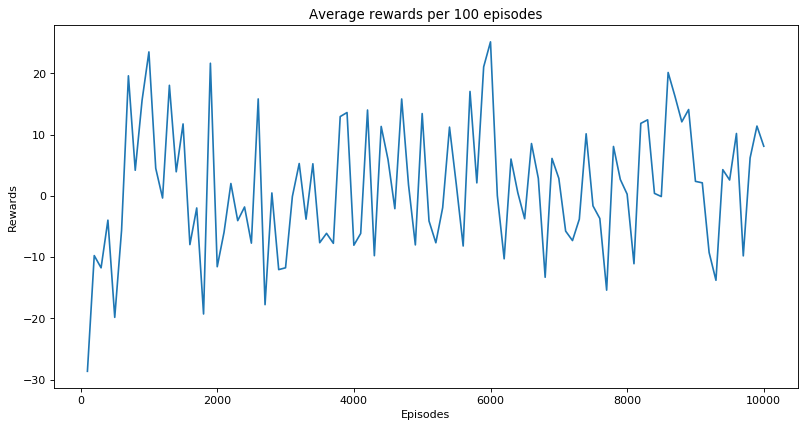

In [12]:
#Plot the average rewards per 100 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 100 episodes')
plt.plot(df['Episodes'], df['Avg_Reward'])

# Calculate Average Rewards per 50 Episodes

In [13]:
sum_rewards = 0
avg_rewards_per_50 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%50) == 0 :
        avg_rewards_per_50.append(sum_rewards/50)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%50==0):
            break
        else:
            avg_rewards_per_50.append(sum_rewards/(i%50))
        
avg_rewards_per_50

len(avg_rewards_per_50)

200

In [14]:
df_50 = pd.DataFrame()
df_50 = df_50.fillna(0)
df_50['Avg_Reward'] = avg_rewards_per_50
df_50['Episodes'] = (df_50.index+1)*50
df_50

,Avg_Reward,Episodes
0,-47.26,50
1,-10.00,100
2,6.22,150
3,-25.72,200
4,-17.34,250
...,...,...
195,-1.52,9800
196,20.12,9850
197,2.64,9900
198,10.04,9950


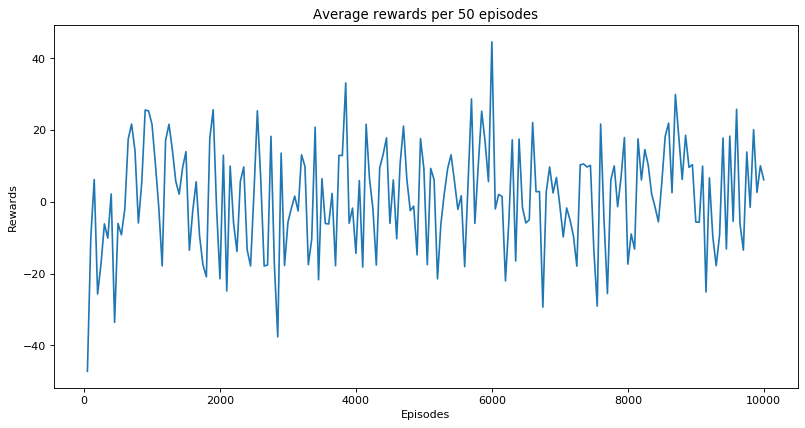

In [15]:
#Plot the average rewards per 50 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 50 episodes')
plt.plot(df_50['Episodes'], df_50['Avg_Reward'])

# Calculate Average Rewards per 10 Episodes

In [16]:
sum_rewards = 0
avg_rewards_per_10 = []

for i in range (1, len(episodes_rewards_list)+1):
    sum_rewards += episodes_rewards_list[i-1] 
    if (i%10) == 0 :
        avg_rewards_per_10.append(sum_rewards/10)
        sum_rewards=0
    if (i==len(episodes_rewards_list)):
        if (i%10==0):
            break
        else:
            avg_rewards_per_10.append(sum_rewards/(i%10))
        
avg_rewards_per_10

len(avg_rewards_per_10)

1000

In [17]:
df_10 = pd.DataFrame()
df_10 = df_10.fillna(0)
df_10['Avg_Reward'] = avg_rewards_per_10
df_10['Episodes'] = (df_10.index+1)*10
df_10

,Avg_Reward,Episodes
0,-106.4,10
1,-31.0,20
2,-28.5,30
3,-46.0,40
4,-24.4,50
...,...,...
995,14.5,9960
996,-4.8,9970
997,32.2,9980
998,13.9,9990


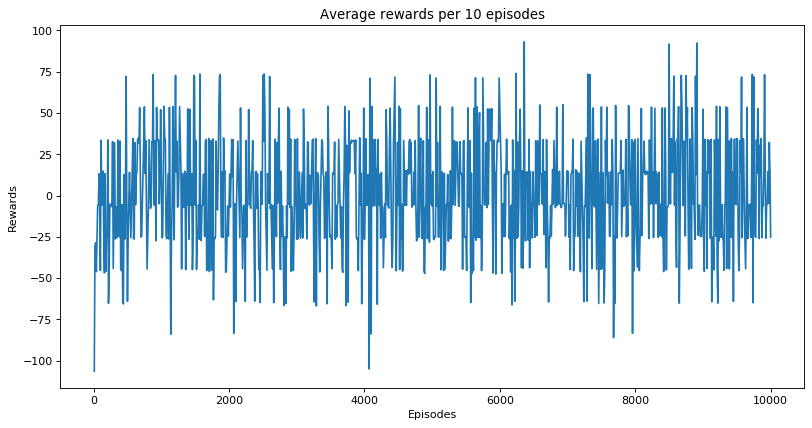

In [18]:
#Plot the average rewards per 10 episodes
plt.figure(figsize=(12,6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.title('Average rewards per 10 episodes')
plt.plot(df_10['Episodes'], df_10['Avg_Reward'])

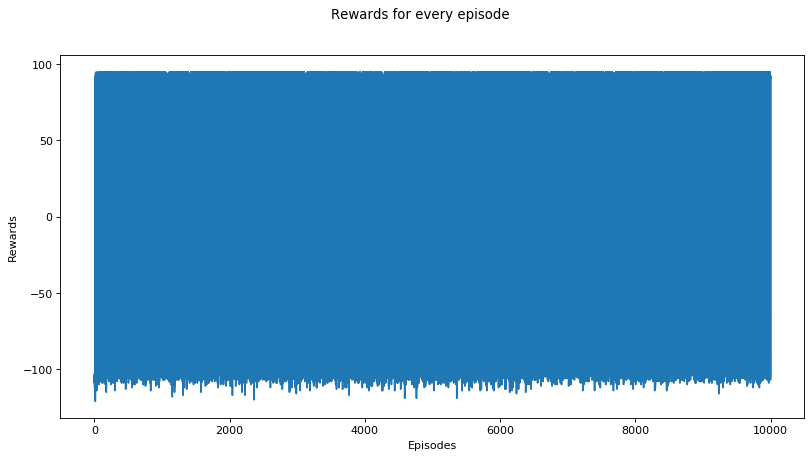

In [19]:
#%% Plot the reward for every episode
reward_per_episode = pd.DataFrame(np.asarray(episodes_rewards_list)) 
reward_per_episode['episodes'] = reward_per_episode.index
reward_per_episode.columns = ['total_reward', 'episodes']


plt.figure(figsize=(12, 6), dpi=80)
plt.xlabel('Episodes')
plt.ylabel('Rewards')
plt.suptitle('Rewards for every episode')
plt.plot(reward_per_episode['episodes'], reward_per_episode['total_reward'])